## Google Research - Identify Contrails to Reduce Global Warming

### Import modules

In [1]:
# basic modules
import pandas as pd
import numpy as np
import datetime
import os
from tqdm import tqdm

import random

# Visualization
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython import display

# pytorch modules
import torch
from torch.utils.data import Dataset, DataLoader
from torch.nn import BCELoss, Sigmoid
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau 
from torchvision.transforms import Normalize
from torch.multiprocessing import Pool

In [2]:
base_dir = "/kaggle/input/google-research-identify-contrails-reduce-global-warming/"
train_path = os.path.join(base_dir,"train")
test_path = os.path.join(base_dir,"test")
val_path = os.path.join(base_dir,"validation")

train_ids = os.listdir(train_path)
test_ids = os.listdir(test_path)
val_ids = os.listdir(val_path)

### Combine bands into a false color image (ASH Transform)

[In order to view contrails in GOES, we use the "ash" color scheme. This color scheme was originally developed for viewing volcanic ash in the atmosphere but is also useful for viewing thin cirrus, including contrails. In this color scheme, contrails appear in the image as dark blue.](https://www.kaggle.com/code/inversion/visualizing-contrails)

- `Input` = np.ndarray of shape `(Bands=3, Time_frame=8, H=256, W=256)` where Bands corresponds to bands `[11, 14, 15]`.
- `Output` = np.ndarray of shape `(Time_frame=8, Channel=3, H=256, W=256)` where Channel corresponds to rgb colorscheme.

In [3]:
def ash_transform(x, time_frame:int=4):
    _T11_BOUNDS = (243, 303)
    _CLOUD_TOP_TDIFF_BOUNDS = (-4, 5)
    _TDIFF_BOUNDS = (-4, 2)
    if time_frame is not None:
        x = x[:,time_frame,:,:]
    def normalize_range(data, bounds):
        """Maps data to the range [0, 1]."""
        return (data - bounds[0]) / (bounds[1] - bounds[0])

    r = normalize_range(x[2] - x[1], _TDIFF_BOUNDS)
    g = normalize_range(x[1] - x[0], _CLOUD_TOP_TDIFF_BOUNDS)
    b = normalize_range(x[1], _T11_BOUNDS)
    return np.clip(np.stack([r, g, b], axis=-3), 0, 1) # (T,3,H,W) or (3,H,W)

Augmentation (by GPT)

In [ ]:

def random_horizontal_flip(video):
    if random.random() < 0.5:
        return video[..., ::-1]
    return video

def random_vertical_flip(video):
    if random.random() < 0.5:
        return video[..., ::-1, :]
    return video

def random_mask(img, mask_size=25):
    if random.random() < 0.5:
        h, w = img.shape[-2:]
        top = random.randint(0, h - mask_size)
        left = random.randint(0, w - mask_size)
        img[..., top:top+mask_size, left:left+mask_size] = 0
    return img

def augment_video(video):
    video = random_vertical_flip(video)
    video = np.stack([random_mask(frame) for frame in video.transpose(1, 0, 2, 3)])

    return video.transpose(1, 0, 2, 3)


# Test with dummy data
#video = np.random.rand(3, 10, 224, 224)
#augmented_video = augment_video(video)


### CustomDataset and DataLoader

- `ids` = record ids
- `base_dir` = path to parent(train/val/test) dir
- `bands` = list of integers corresponding bands(band_xx.npy). Default:loads all bands 
- `transforms` = list of function applied to np.ndarray of shape `(Band, Time_frame, H, W)`
- `Output` = torch.tensor, dtype = `torch.float32`

In [4]:
class ContrailDataset(Dataset):
    def __init__(self, ids, base_dir, bands=None, transforms:list=[], test_mode:bool=False, aug=False):
        self.ids = ids
        self.base_dir = base_dir
        self.transforms = transforms
        self.bands = bands
        self.permute = (2,0,1)
        self.test_mode = test_mode
        self.aug = aug
        
    def __getitem__(self, index):
        record_id = self.ids[index]
        
        if self.bands is None:
            band_list = [f'band_{band:02d}.npy' for band in range(8,17)]
        else :
            band_list = [f'band_{int(band):02d}.npy' for band in self.bands]
        
        x = list()
        for band in band_list:
            x_path = os.path.join(self.base_dir, record_id, band)
            x.append(np.load(x_path).transpose(self.permute))

        x = np.stack(x,axis=1) ## X.shape = (Time_frame,channel,H,W)
        
        x = x.transpose((1,0,2,3)) ## PLUS ## X.shape = (channel, Time_frame ,H,W)
        
        #print(x.shape)
        
        for transformation in self.transforms:
            x = transformation(x)
            
        if self.aug:
            x = augment_video(x)
        
        x = torch.from_numpy(x.astype(np.float32))
        
        if self.test_mode:
            return x
        else:
            y_path = os.path.join(self.base_dir, record_id,'human_pixel_masks.npy')
            y = torch.from_numpy(np.load(y_path).transpose(self.permute).astype(np.float32))

            return x, y

    def __len__(self):
        return len(self.ids)
        
    

### Initiate Dataset and DataLoader

In [5]:
# Datasets 
dataset_params = {
    "bands" : [11,14,15], 
    "transforms" : [ash_transform]
}
train_dataset = ContrailDataset(train_ids, train_path, **dataset_params, aug=True)
test_dataset = ContrailDataset(test_ids, test_path, test_mode=True, **dataset_params)
val_dataset = ContrailDataset(val_ids, val_path, **dataset_params)

# DalaLoaders
dataloader_params = {
    "batch_size" : 16,
    "shuffle" : True,
    "num_workers": 2,
    "drop_last": True
#     "pin_memory": True

}
train_loader = DataLoader(train_dataset, **dataloader_params)
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=2)
val_loader = DataLoader(val_dataset, **dataloader_params)

### Visualization

In [6]:
def plot_contrail(x, y, time_frame = 4):
    '''
    x = false color img of shape (8, 3, H, W)
    y = contrail mask of shape (1, H, W)
    time_frame = int, default = 4
    '''
    if x.ndim == 4:
        x = x[time_frame]
    
    plt.figure(figsize=(18, 6))
    ax = plt.subplot(1, 3, 1)
    ax.imshow(x.permute(1,2,0))
    ax.set_title('False color image')

    ax = plt.subplot(1, 3, 2)
    ax.imshow(y.permute(1,2,0), interpolation='none')
    ax.set_title('Ground truth contrail mask')

    ax = plt.subplot(1, 3, 3)
    ax.imshow(x.permute(1,2,0))
    ax.imshow(y.permute(1,2,0), cmap='Reds', alpha=.4, interpolation='none')
    ax.set_title('Contrail mask on false color image');

    plt.show()

def plot_contrail_comparision(x, y_true, y_pred, time_frame = 4):
    '''
    x = false color img of shape (3, H, W) or (8, 3, H, W)
    y_true = target contrail mask of shape (1, H, W)
    y_pred = predicted contrail mask of shape (1, H, W)
    time_frame = int, default = 4
    '''
    if x.ndim == 4:
        x = x[time_frame]
    
    plt.figure(figsize=(18, 6))
    ax = plt.subplot(1, 5, 1)
    ax.imshow(x.permute(1,2,0))
    ax.set_title('False color image(x)')
    ax.axis('off')
    
    ax = plt.subplot(1, 5, 2)
    ax.imshow(y_true.permute(1,2,0), interpolation='none')
    ax.set_title('True contrail mask(y_true)')
    ax.axis('off')
    
    ax = plt.subplot(1, 5, 3)
    ax.imshow(x.permute(1,2,0))
    ax.imshow(y_true.permute(1,2,0), cmap='Reds', alpha=.4, interpolation='none')
    ax.set_title('y_true mask on x')
    ax.axis('off')
    
    ax = plt.subplot(1, 5, 4)
    ax.imshow(y_pred.permute(1,2,0), interpolation='none')
    ax.set_title('Pred contrail mask(y_pred)')
    ax.axis('off')

    ax = plt.subplot(1, 5, 5)
    ax.imshow(x.permute(1,2,0))
    ax.imshow(y_pred.permute(1,2,0), cmap='Reds', alpha=.4, interpolation='none')
    ax.set_title('y_pred mask on x')
    ax.axis('off')
    
    plt.show()

def animate_contrail(x):
    '''
    x = false color img of shape (8, 3, H, W)
    '''
    if x.ndim !=4:
        print(f"Incorrect input dimensions, Expected 4 recievied {x.ndim}.")
        return
    # Animation
    fig = plt.figure(figsize=(4, 4))
    im = plt.imshow(x[0].permute(1,2,0))
    def draw(i):
        im.set_array(x[i].permute(1,2,0))
        return [im]
    anim = animation.FuncAnimation(
        fig, draw, frames=x.shape[0], interval=100, blit=True
    )
    plt.close()
    return display.HTML(anim.to_jshtml())

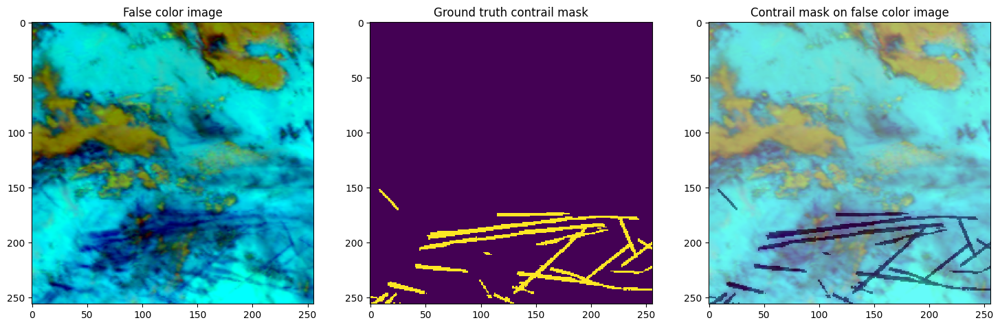

Incorrect input dimensions, Expected 4 recievied 3.


In [7]:
 x, y = train_dataset[train_ids.index('1704010292581573769')]
 plot_contrail(x, y)
 animate_contrail(x)

### Essential functions
- Dice coefficient
- Callbacks to track loss and other params
- Callbacks to save best state

In [8]:
# Dice Coefficient
def dice_coeff(mask1, mask2):
    intersect = torch.sum(mask1 * mask2)
    m1sum = torch.sum(mask1)
    m2sum = torch.sum(mask2)
    dice = (2 * intersect ) / (m1sum + m2sum)
    return dice.item()

# # Example
# mask1 = torch.randint(0,2,(10, 256,256))
# mask2 = torch.randint(0,2,(10, 256,256))
# print(dice_coeff(mask1, mask2))

In [9]:
# Callbacks
class History:
    def __init__(self, print_prefix, save_to_disk=True):
        self.train_batch_history = []
        self.val_batch_histroy = []
        self.train_epoch_history = []
        self.val_epoch_history = []
        self.running_train_batch_history = []
        self.running_val_batch_history = []
        self.print_prefix = print_prefix
        self.save_to_disk = save_to_disk
        if save_to_disk:
            self.save_path = os.path.join(os.getcwd(),"saved_states",self.print_prefix)
            if not os.path.exists(self.save_path):
                os.makedirs(self.save_path)
    def on_train_batch_end(self, data):
        self.running_train_batch_history.append(data)
        
    def on_val_batch_end(self, data):
        self.running_val_batch_history.append(data)
        
    def on_epoch_end(self):
        self.train_epoch_history.append(np.mean(self.running_train_batch_history))
        self.train_batch_history.extend(self.running_train_batch_history)
        self.running_train_batch_history=[]
        self.val_epoch_history.append(np.mean(self.running_val_batch_history))
        self.val_batch_histroy.extend(self.running_val_batch_history)
        self.running_val_batch_history=[]
        print(f"{self.print_prefix}: Train = {self.train_epoch_history[-1]:.6f} \
        | Val = {self.val_epoch_history[-1]:.6f}")
    
    def on_end(self):
        if self.save_to_disk:
            dt = datetime.datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
            np.save(os.path.join(self.save_path,"train_batch.npy"),self.train_batch_history)
            np.save(os.path.join(self.save_path,"val_batch.npy"),self.val_batch_histroy)
            np.save(os.path.join(self.save_path,"train_epoch.npy"),self.train_epoch_history)
            np.save(os.path.join(self.save_path,"val_epoch.npy"),self.val_epoch_history)

In [10]:
class BestStateTracker:
    def __init__(self, model, optim, trigger:History, save_to_disk:bool = False):
        self.trigger = trigger
        self.model = model
        self.optim = optim
        self.optim_state = None
        self.model_state = None
        self.best_loss = np.inf
        self.save_to_disk = save_to_disk
        if save_to_disk:
            self.save_path = os.path.join(os.getcwd(),"saved_states")
            if not os.path.exists(self.save_path):
                os.mkdir(self.save_path)
                
    def on_epoch_end(self):
        if self.trigger.val_epoch_history[-1] < self.best_loss:
            self.model_state = self.model.state_dict()
            self.optim_state = self.optim.state_dict()
            
    def on_end(self):
        if self.save_to_disk:
            dt = datetime.datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
            torch.save(self.model_state,os.path.join(self.save_path,f"model_state_{dt}.pt"))
            torch.save(self.optim_state,os.path.join(self.save_path,f"optim_state_{dt}.pt"))

### Model Architecture

In [11]:
# Config
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LR = 1e-2
EPOCHS = 30

In [12]:
model = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet',
                       in_channels=3, out_channels=1, init_features=32, 
                       pretrained=False).to(DEVICE)
optimizer = Adam(params=model.parameters(), lr=LR)
loss_fn = BCELoss()
scheduler = ReduceLROnPlateau(optimizer)
loss_tracker = History(print_prefix="Loss")
dice_tracker = History(print_prefix="Dice")
save_state = BestStateTracker(model,optimizer,loss_tracker,save_to_disk=True)

/opt/conda/lib/python3.10/site-packages/torch/hub.py:286: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/mateuszbuda/brain-segmentation-pytorch/zipball/master" to /root/.cache/torch/hub/master.zip


### Model Train

  0%|          | 0/30 [00:00<?, ?it/s]


EPOCH: 1/30


Train Batch: 1283/1283        | Loss: 0.014716:   0%|          | 0/30 [15:22<?, ?it/s]

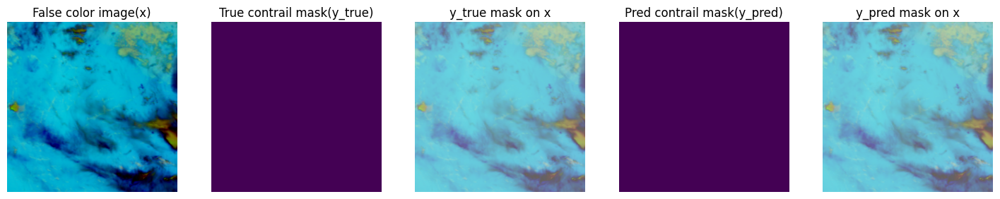

Val Batch:   116/116            | Loss: 0.008559:   0%|          | 0/30 [16:48<?, ?it/s]

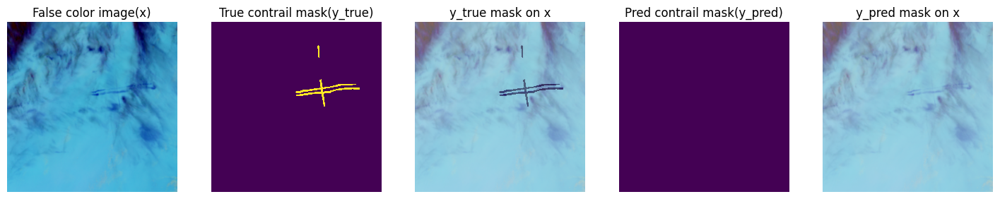

Val Batch:   116/116            | Loss: 0.008559:   3%|▎         | 1/30 [16:49<8:07:45, 1009.15s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.027617         | Val = 0.012365
Dice: Train = 0.000018         | Val = nan

EPOCH: 2/30


Train Batch: 1283/1283        | Loss: 0.012670:   3%|▎         | 1/30 [29:46<8:07:45, 1009.15s/it]  

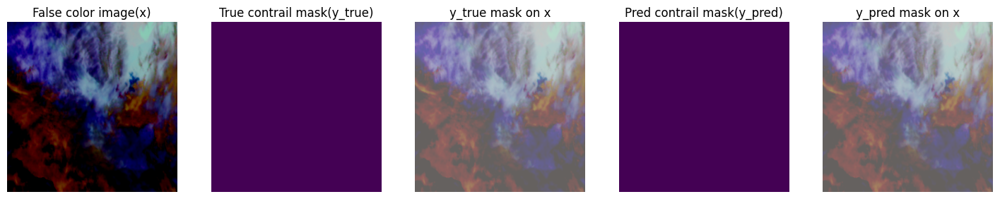

Val Batch:   116/116            | Loss: 0.009603:   3%|▎         | 1/30 [30:56<8:07:45, 1009.15s/it]

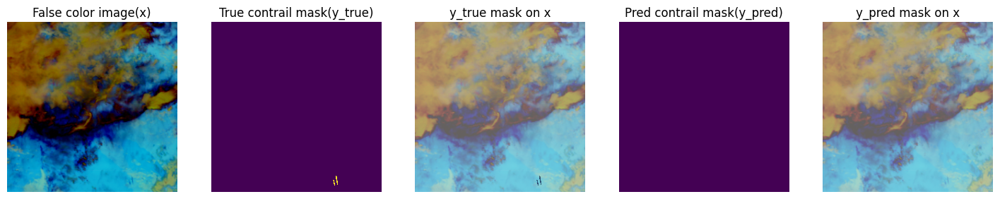

Val Batch:   116/116            | Loss: 0.009603:   7%|▋         | 2/30 [30:57<7:06:41, 914.34s/it] 

Train sample(above), Val sample(below)
Loss: Train = 0.017790         | Val = 0.006976
Dice: Train = 0.022771         | Val = 0.239833

EPOCH: 3/30


Train Batch: 1283/1283        | Loss: 0.024338:   7%|▋         | 2/30 [43:44<7:06:41, 914.34s/it]  

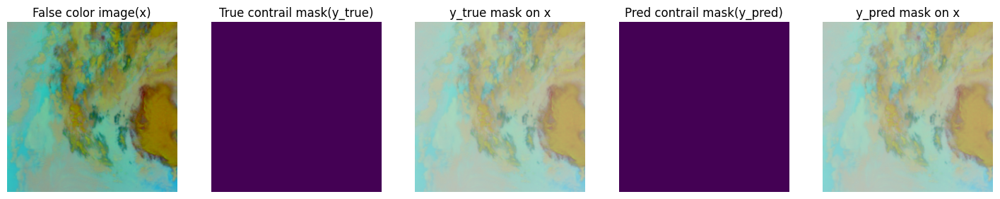

Val Batch:   116/116            | Loss: 0.005608:   7%|▋         | 2/30 [44:52<7:06:41, 914.34s/it]

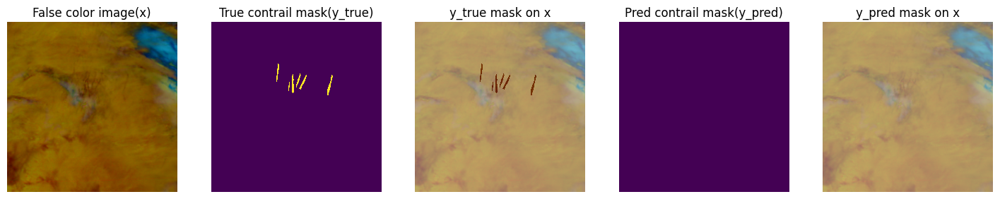

Val Batch:   116/116            | Loss: 0.005608:  10%|█         | 3/30 [44:53<6:35:20, 878.54s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.014380         | Val = 0.007195
Dice: Train = 0.396276         | Val = 0.268031

EPOCH: 4/30


Train Batch: 1283/1283        | Loss: 0.007722:  10%|█         | 3/30 [57:46<6:35:20, 878.54s/it]  

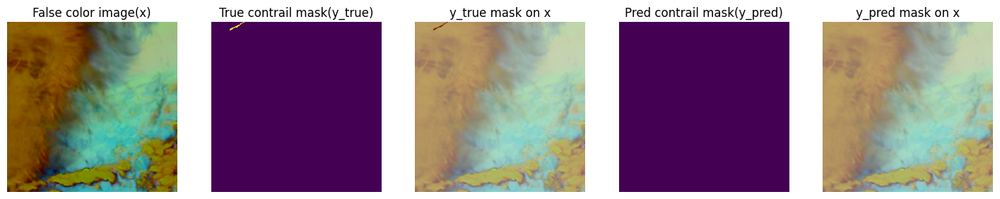

Val Batch:   116/116            | Loss: 0.008616:  10%|█         | 3/30 [58:59<6:35:20, 878.54s/it]

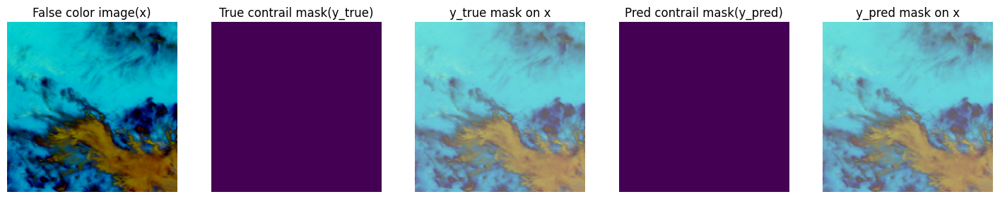

Val Batch:   116/116            | Loss: 0.008616:  13%|█▎        | 4/30 [59:00<6:15:18, 866.11s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.013084         | Val = 0.005537
Dice: Train = 0.458551         | Val = nan

EPOCH: 5/30


Train Batch: 1283/1283        | Loss: 0.009048:  13%|█▎        | 4/30 [1:12:12<6:15:18, 866.11s/it]

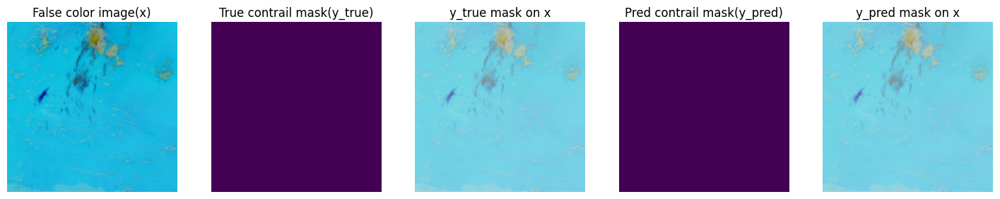

Val Batch:   116/116            | Loss: 0.002361:  13%|█▎        | 4/30 [1:13:21<6:15:18, 866.11s/it]

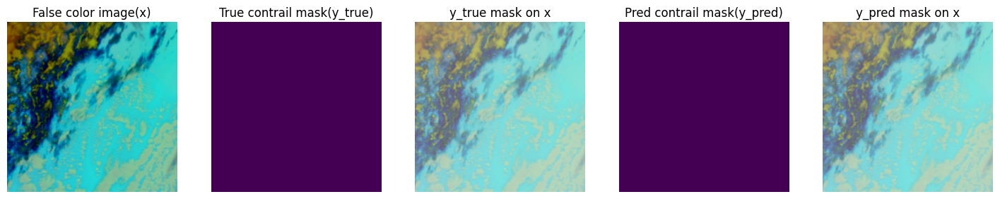

Val Batch:   116/116            | Loss: 0.002361:  17%|█▋        | 5/30 [1:13:21<6:00:12, 864.51s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.012361         | Val = 0.005248
Dice: Train = 0.485219         | Val = nan

EPOCH: 6/30


Train Batch: 1283/1283        | Loss: 0.007827:  17%|█▋        | 5/30 [1:26:36<6:00:12, 864.51s/it]  

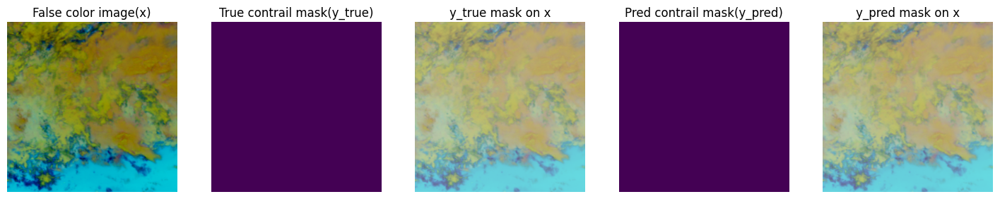

Val Batch:   116/116            | Loss: 0.002410:  17%|█▋        | 5/30 [1:27:47<6:00:12, 864.51s/it]

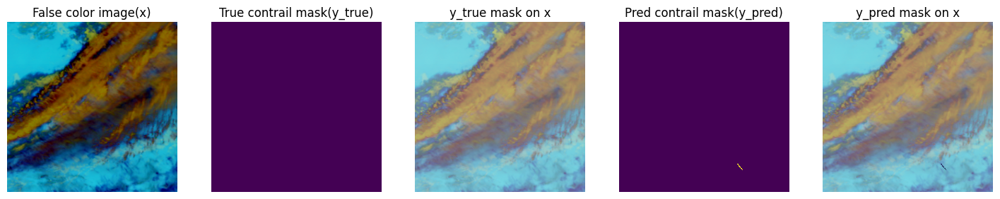

Val Batch:   116/116            | Loss: 0.002410:  20%|██        | 6/30 [1:27:47<5:46:01, 865.07s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.011646         | Val = 0.005226
Dice: Train = 0.510375         | Val = 0.455061

EPOCH: 7/30


Train Batch: 1283/1283        | Loss: 0.016156:  20%|██        | 6/30 [1:40:36<5:46:01, 865.07s/it]  

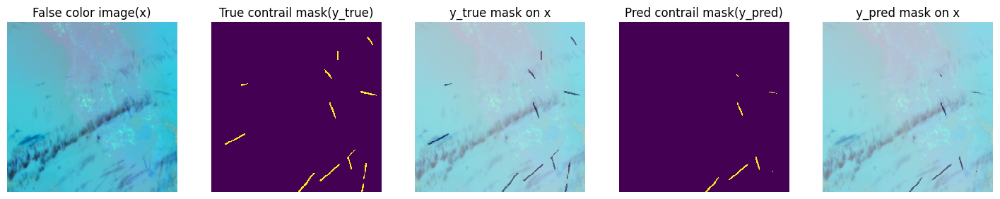

Val Batch:   116/116            | Loss: 0.003792:  20%|██        | 6/30 [1:41:46<5:46:01, 865.07s/it]

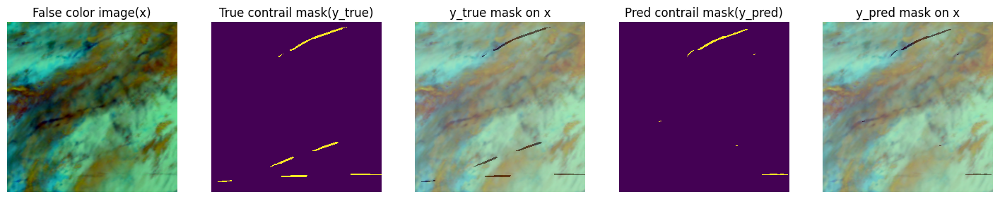

Val Batch:   116/116            | Loss: 0.003792:  23%|██▎       | 7/30 [1:41:46<5:28:19, 856.48s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.011174         | Val = 0.005033
Dice: Train = 0.527348         | Val = 0.341537

EPOCH: 8/30


Train Batch: 1283/1283        | Loss: 0.006314:  23%|██▎       | 7/30 [1:54:22<5:28:19, 856.48s/it]  

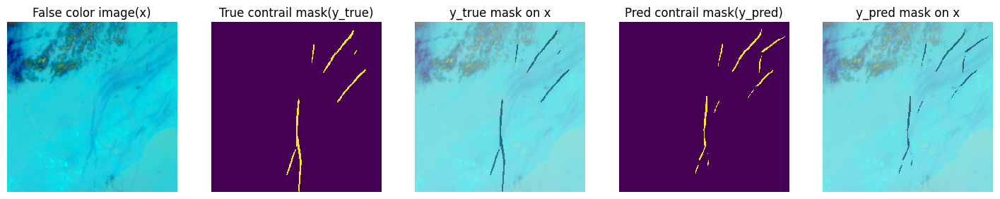

Val Batch:   116/116            | Loss: 0.004138:  23%|██▎       | 7/30 [1:55:30<5:28:19, 856.48s/it]

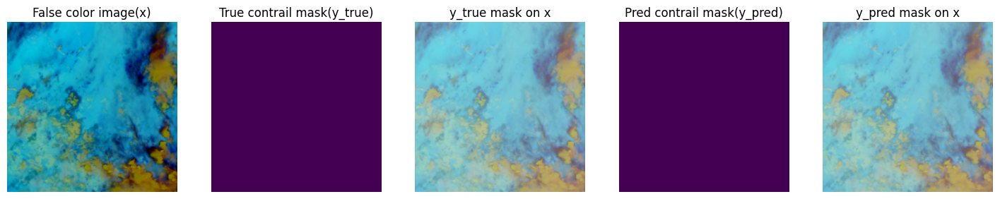

Val Batch:   116/116            | Loss: 0.004138:  27%|██▋       | 8/30 [1:55:31<5:10:19, 846.33s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.010801         | Val = 0.004933
Dice: Train = 0.543518         | Val = 0.443707

EPOCH: 9/30


Train Batch: 1283/1283        | Loss: 0.007520:  27%|██▋       | 8/30 [2:08:34<5:10:19, 846.33s/it]  

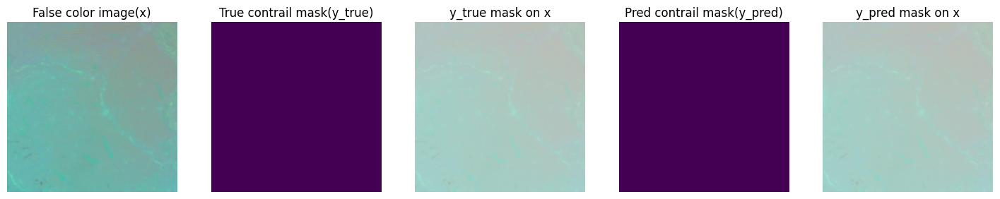

Val Batch:   116/116            | Loss: 0.003303:  27%|██▋       | 8/30 [2:09:44<5:10:19, 846.33s/it]

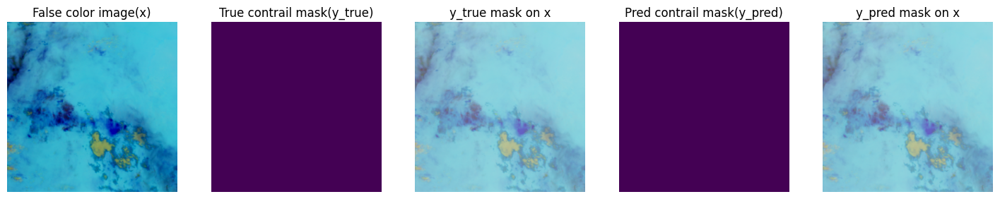

Val Batch:   116/116            | Loss: 0.003303:  30%|███       | 9/30 [2:09:45<4:57:02, 848.70s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.010449         | Val = 0.004716
Dice: Train = 0.558226         | Val = 0.475141

EPOCH: 10/30


Train Batch: 1283/1283        | Loss: 0.016248:  30%|███       | 9/30 [2:22:57<4:57:02, 848.70s/it]  

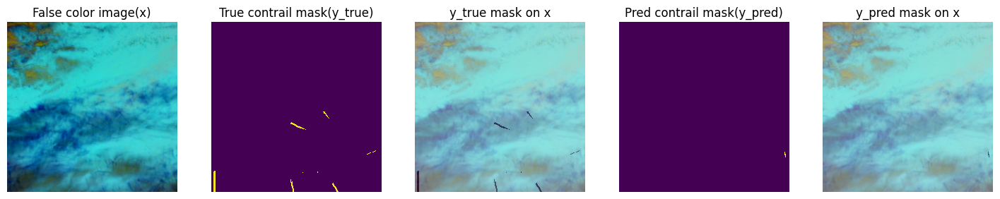

Val Batch:   116/116            | Loss: 0.007640:  30%|███       | 9/30 [2:24:12<4:57:02, 848.70s/it]

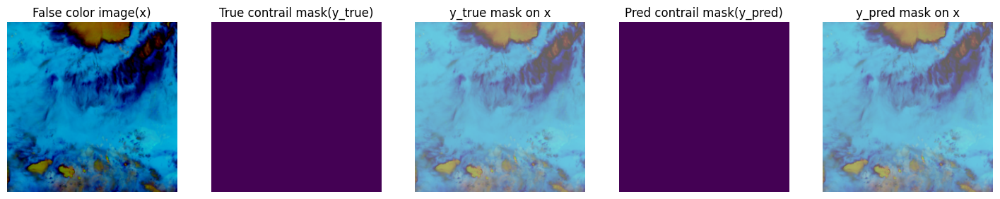

Val Batch:   116/116            | Loss: 0.007640:  33%|███▎      | 10/30 [2:24:13<4:44:52, 854.60s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.010162         | Val = 0.005133
Dice: Train = 0.566886         | Val = 0.371976

EPOCH: 11/30


Train Batch: 1283/1283        | Loss: 0.015192:  33%|███▎      | 10/30 [2:37:42<4:44:52, 854.60s/it]  

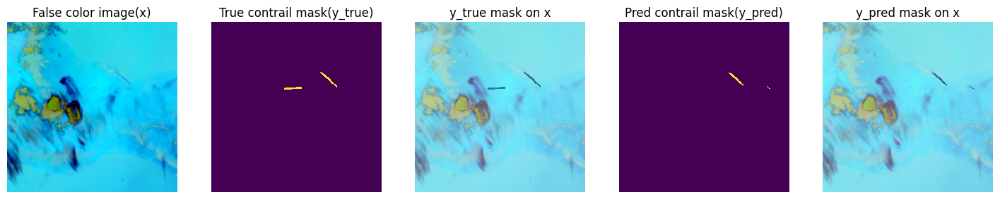

Val Batch:   116/116            | Loss: 0.009162:  33%|███▎      | 10/30 [2:38:57<4:44:52, 854.60s/it]

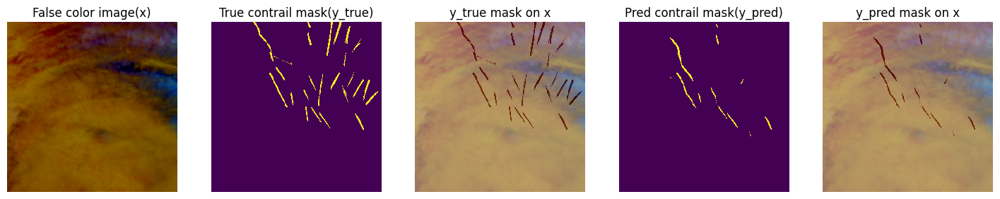

Val Batch:   116/116            | Loss: 0.009162:  37%|███▋      | 11/30 [2:38:58<4:33:33, 863.89s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.009862         | Val = 0.004557
Dice: Train = 0.579015         | Val = 0.485439

EPOCH: 12/30


Train Batch: 1283/1283        | Loss: 0.013904:  37%|███▋      | 11/30 [2:51:48<4:33:33, 863.89s/it]  

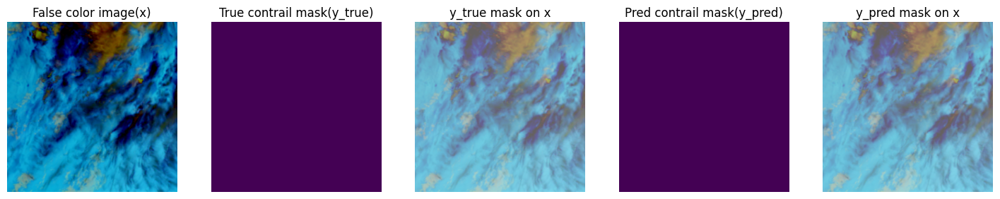

Val Batch:   116/116            | Loss: 0.001249:  37%|███▋      | 11/30 [2:52:57<4:33:33, 863.89s/it]

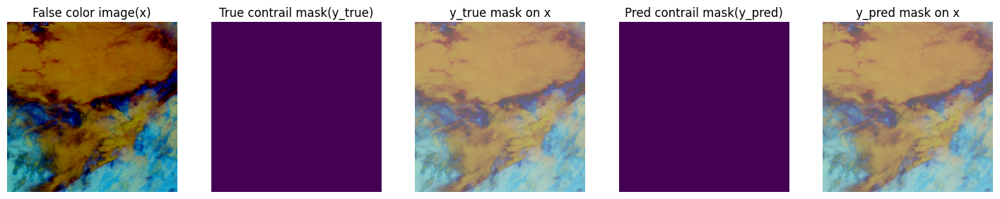

Val Batch:   116/116            | Loss: 0.001249:  40%|████      | 12/30 [2:52:57<4:16:58, 856.59s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.009846         | Val = 0.004362
Dice: Train = 0.579079         | Val = 0.474785

EPOCH: 13/30


Train Batch: 1283/1283        | Loss: 0.012549:  40%|████      | 12/30 [3:05:50<4:16:58, 856.59s/it]  

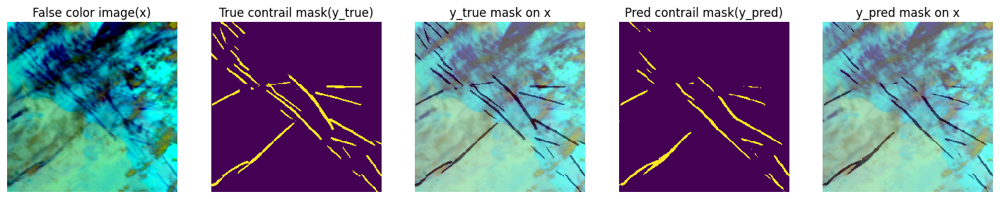

Val Batch:   116/116            | Loss: 0.003928:  40%|████      | 12/30 [3:06:59<4:16:58, 856.59s/it]

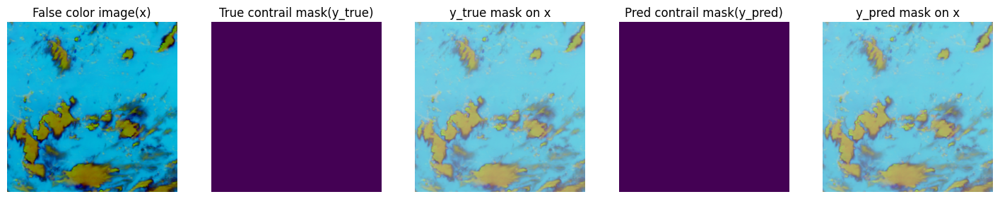

Val Batch:   116/116            | Loss: 0.003928:  43%|████▎     | 13/30 [3:06:59<4:01:26, 852.16s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.009469         | Val = 0.004583
Dice: Train = 0.592032         | Val = nan

EPOCH: 14/30


Train Batch: 1283/1283        | Loss: 0.005999:  43%|████▎     | 13/30 [3:20:22<4:01:26, 852.16s/it]  

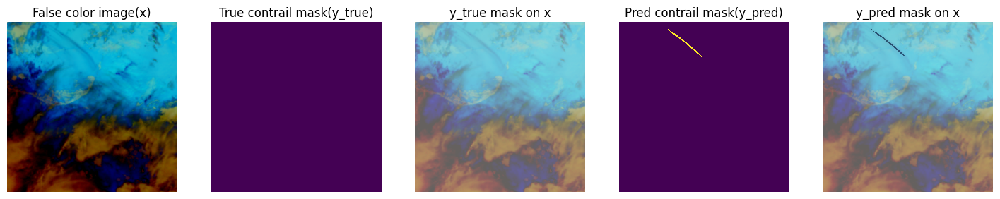

Val Batch:   116/116            | Loss: 0.010059:  43%|████▎     | 13/30 [3:21:34<4:01:26, 852.16s/it]

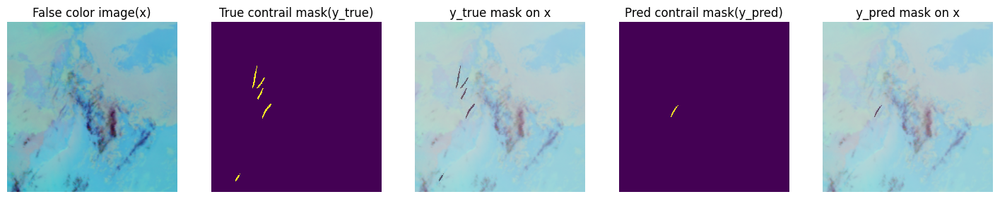

Val Batch:   116/116            | Loss: 0.010059:  47%|████▋     | 14/30 [3:21:34<3:49:05, 859.07s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.009279         | Val = 0.005137
Dice: Train = 0.600945         | Val = 0.382156

EPOCH: 15/30


Train Batch: 1283/1283        | Loss: 0.008151:  47%|████▋     | 14/30 [3:35:23<3:49:05, 859.07s/it]  

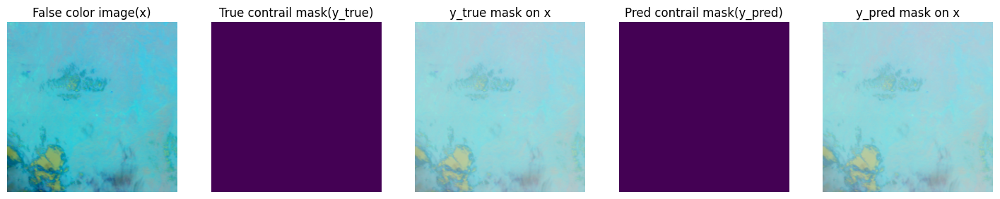

Val Batch:   116/116            | Loss: 0.013136:  47%|████▋     | 14/30 [3:36:34<3:49:05, 859.07s/it]

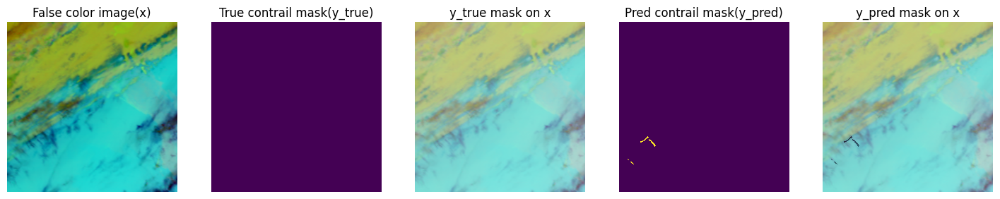

Val Batch:   116/116            | Loss: 0.013136:  50%|█████     | 15/30 [3:36:35<3:37:53, 871.56s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.009112         | Val = 0.005625
Dice: Train = 0.608399         | Val = 0.509091

EPOCH: 16/30


Train Batch: 1283/1283        | Loss: 0.010738:  50%|█████     | 15/30 [3:49:44<3:37:53, 871.56s/it]  

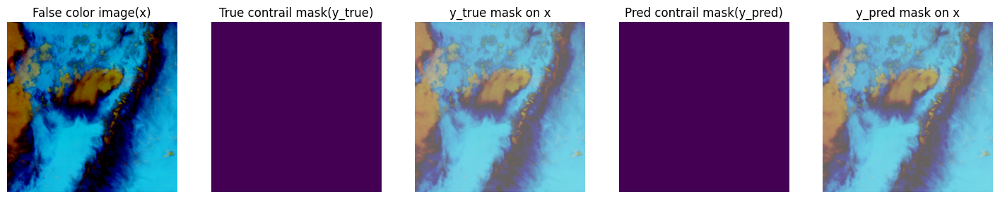

Val Batch:   116/116            | Loss: 0.001822:  50%|█████     | 15/30 [3:50:54<3:37:53, 871.56s/it]

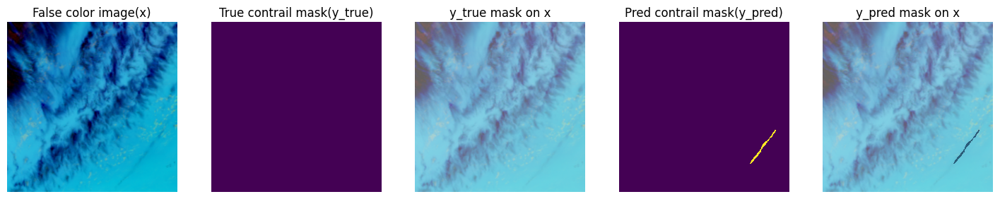

Val Batch:   116/116            | Loss: 0.001822:  53%|█████▎    | 16/30 [3:50:55<3:22:33, 868.09s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.008855         | Val = 0.004211
Dice: Train = 0.618173         | Val = 0.510595

EPOCH: 17/30


Train Batch: 1283/1283        | Loss: 0.004678:  53%|█████▎    | 16/30 [4:03:57<3:22:33, 868.09s/it]  

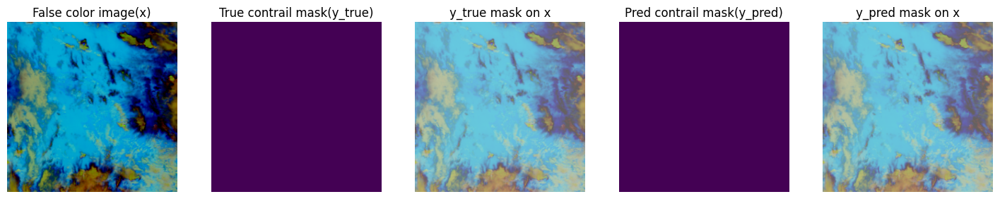

Val Batch:   116/116            | Loss: 0.002522:  53%|█████▎    | 16/30 [4:05:07<3:22:33, 868.09s/it]

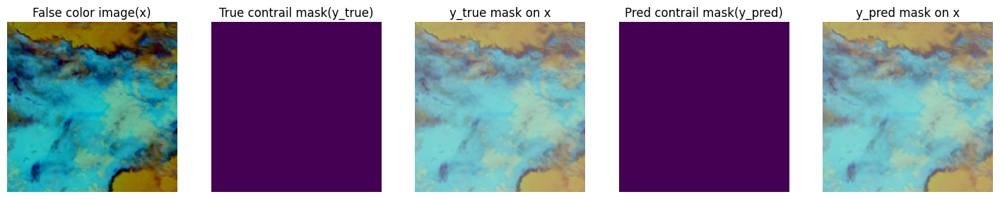

Val Batch:   116/116            | Loss: 0.002522:  57%|█████▋    | 17/30 [4:05:07<3:07:03, 863.37s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.008910         | Val = 0.004561
Dice: Train = 0.614968         | Val = 0.506373

EPOCH: 18/30


Train Batch: 1283/1283        | Loss: 0.004850:  57%|█████▋    | 17/30 [4:18:17<3:07:03, 863.37s/it]  

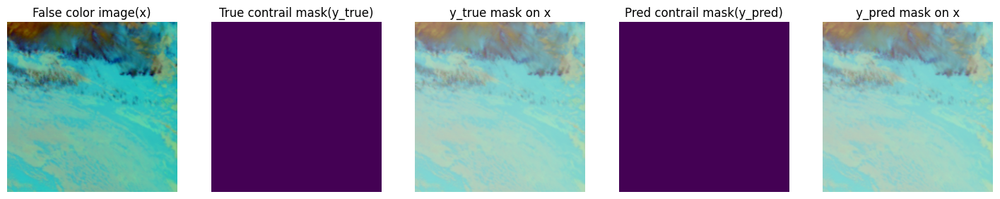

Val Batch:   116/116            | Loss: 0.003482:  57%|█████▋    | 17/30 [4:19:27<3:07:03, 863.37s/it]

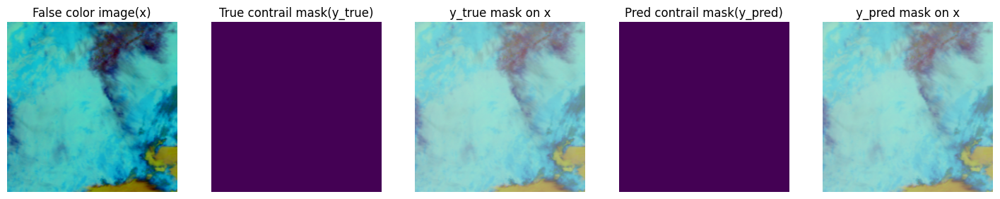

Val Batch:   116/116            | Loss: 0.003482:  60%|██████    | 18/30 [4:19:28<2:52:31, 862.59s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.008543         | Val = 0.004227
Dice: Train = 0.633183         | Val = 0.499980

EPOCH: 19/30


Train Batch: 1283/1283        | Loss: 0.008027:  60%|██████    | 18/30 [4:32:28<2:52:31, 862.59s/it]  

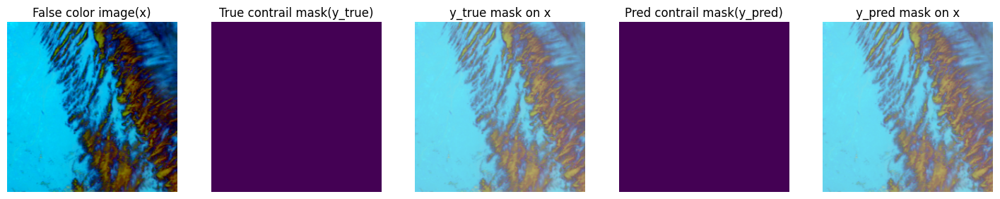

Val Batch:   116/116            | Loss: 0.000557:  60%|██████    | 18/30 [4:33:43<2:52:31, 862.59s/it]

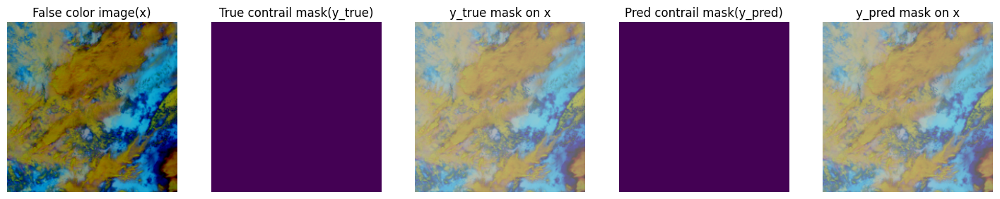

Val Batch:   116/116            | Loss: 0.000557:  63%|██████▎   | 19/30 [4:33:44<2:37:46, 860.59s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.008280         | Val = 0.004315
Dice: Train = 0.641819         | Val = 0.526940

EPOCH: 20/30


Train Batch: 1283/1283        | Loss: 0.003004:  63%|██████▎   | 19/30 [4:46:43<2:37:46, 860.59s/it]  

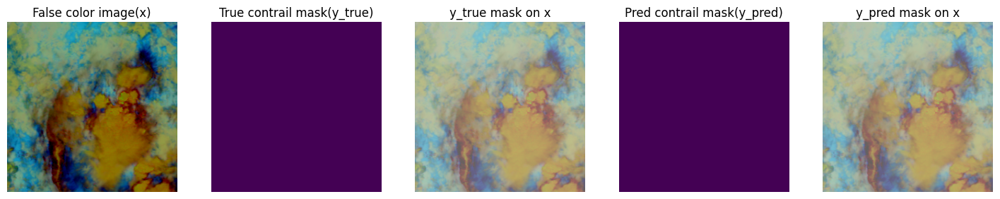

Val Batch:   116/116            | Loss: 0.005237:  63%|██████▎   | 19/30 [4:47:53<2:37:46, 860.59s/it]

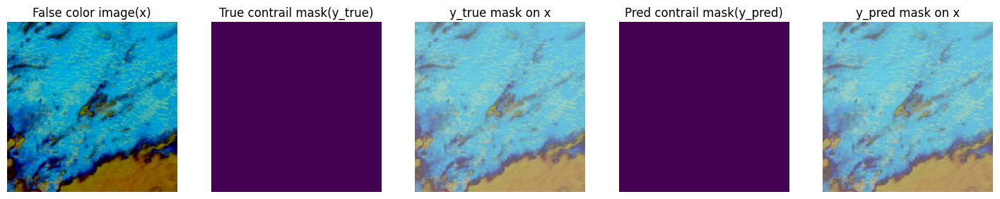

Val Batch:   116/116            | Loss: 0.005237:  67%|██████▋   | 20/30 [4:47:53<2:22:51, 857.16s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.008107         | Val = 0.004633
Dice: Train = 0.649068         | Val = 0.472264

EPOCH: 21/30


Train Batch: 1283/1283        | Loss: 0.005777:  67%|██████▋   | 20/30 [5:00:46<2:22:51, 857.16s/it]  

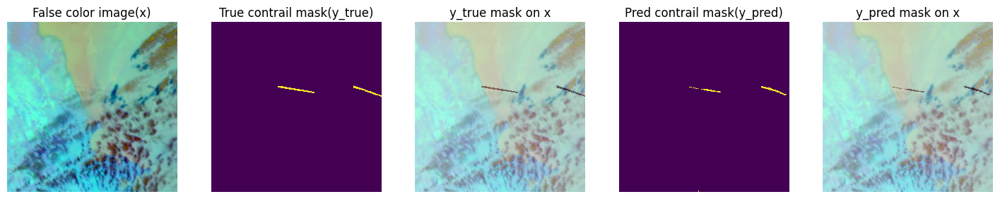

Val Batch:   116/116            | Loss: 0.005586:  67%|██████▋   | 20/30 [5:01:57<2:22:51, 857.16s/it]

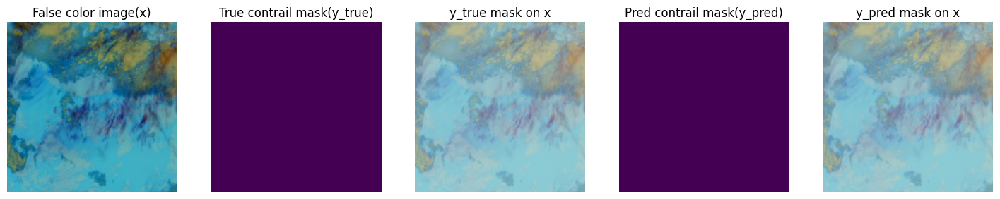

Val Batch:   116/116            | Loss: 0.005586:  70%|███████   | 21/30 [5:01:57<2:07:59, 853.22s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.007906         | Val = 0.004597
Dice: Train = 0.659672         | Val = 0.495969

EPOCH: 22/30


Train Batch: 1283/1283        | Loss: 0.008781:  70%|███████   | 21/30 [5:14:35<2:07:59, 853.22s/it]  

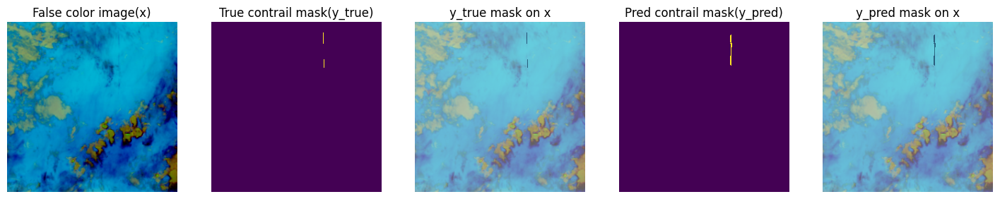

Val Batch:   116/116            | Loss: 0.003856:  70%|███████   | 21/30 [5:15:44<2:07:59, 853.22s/it]

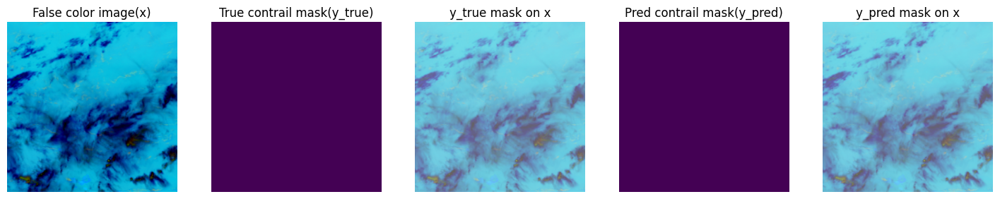

Val Batch:   116/116            | Loss: 0.003856:  73%|███████▎  | 22/30 [5:15:44<1:52:43, 845.38s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.007708         | Val = 0.005067
Dice: Train = 0.668990         | Val = 0.464624

EPOCH: 23/30


Train Batch: 1283/1283        | Loss: 0.009638:  73%|███████▎  | 22/30 [5:28:40<1:52:43, 845.38s/it]  

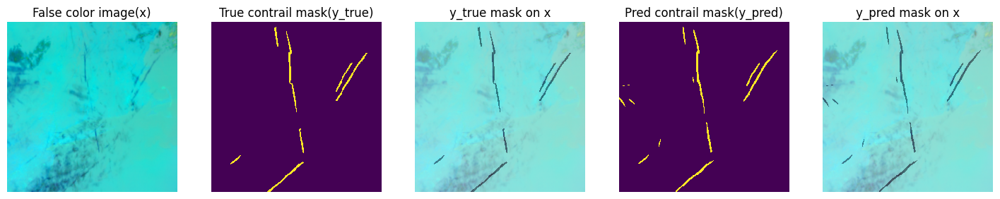

Val Batch:   116/116            | Loss: 0.002564:  73%|███████▎  | 22/30 [5:29:51<1:52:43, 845.38s/it]

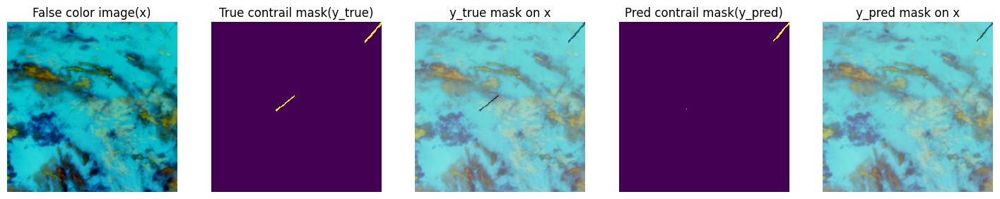

Val Batch:   116/116            | Loss: 0.002564:  77%|███████▋  | 23/30 [5:29:52<1:38:41, 845.98s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.007505         | Val = 0.004808
Dice: Train = 0.677675         | Val = 0.513468

EPOCH: 24/30


Train Batch: 1283/1283        | Loss: 0.006178:  77%|███████▋  | 23/30 [5:42:55<1:38:41, 845.98s/it]  

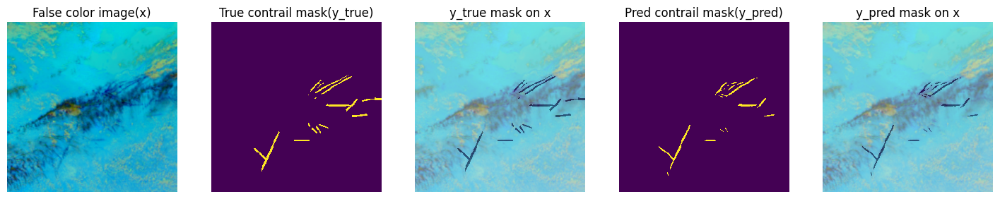

Val Batch:   116/116            | Loss: 0.005386:  77%|███████▋  | 23/30 [5:44:05<1:38:41, 845.98s/it]

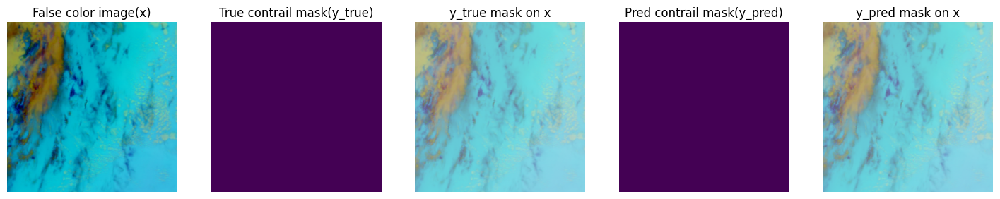

Val Batch:   116/116            | Loss: 0.005386:  80%|████████  | 24/30 [5:44:06<1:24:50, 848.46s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.007500         | Val = 0.005359
Dice: Train = 0.678736         | Val = nan

EPOCH: 25/30


Train Batch: 1283/1283        | Loss: 0.008398:  80%|████████  | 24/30 [5:57:25<1:24:50, 848.46s/it]  

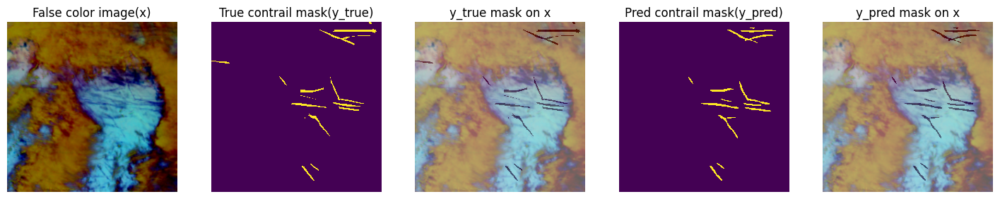

Val Batch:   116/116            | Loss: 0.001905:  80%|████████  | 24/30 [5:58:41<1:24:50, 848.46s/it]

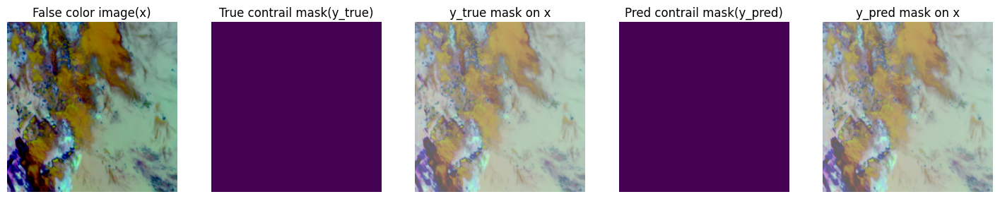

Val Batch:   116/116            | Loss: 0.001905:  83%|████████▎ | 25/30 [5:58:41<1:11:22, 856.48s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.007131         | Val = 0.004750
Dice: Train = nan         | Val = 0.518764

EPOCH: 26/30


Train Batch: 1283/1283        | Loss: 0.007936:  83%|████████▎ | 25/30 [6:12:20<1:11:22, 856.48s/it]  

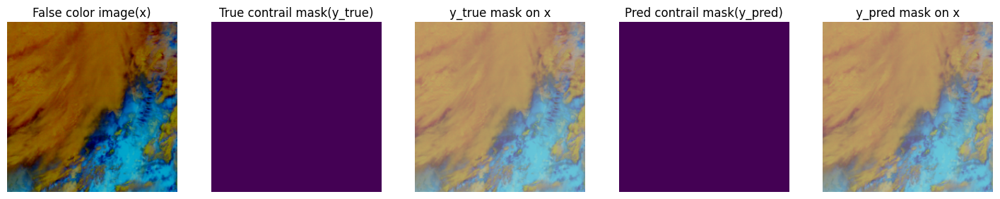

Val Batch:   116/116            | Loss: 0.011799:  83%|████████▎ | 25/30 [6:13:34<1:11:22, 856.48s/it]

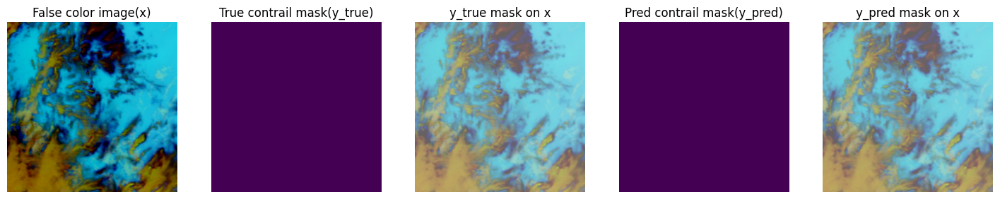

Val Batch:   116/116            | Loss: 0.011799:  87%|████████▋ | 26/30 [6:13:35<57:50, 867.74s/it]  

Train sample(above), Val sample(below)
Loss: Train = 0.007055         | Val = 0.004843
Dice: Train = 0.699909         | Val = 0.533095

EPOCH: 27/30


Train Batch: 1283/1283        | Loss: 0.010470:  87%|████████▋ | 26/30 [6:26:54<57:50, 867.74s/it]  

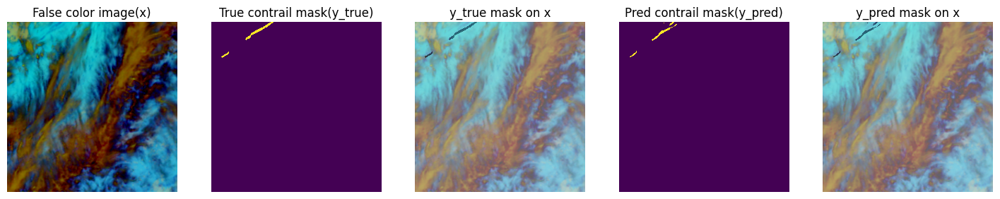

Val Batch:   116/116            | Loss: 0.009341:  87%|████████▋ | 26/30 [6:28:06<57:50, 867.74s/it]

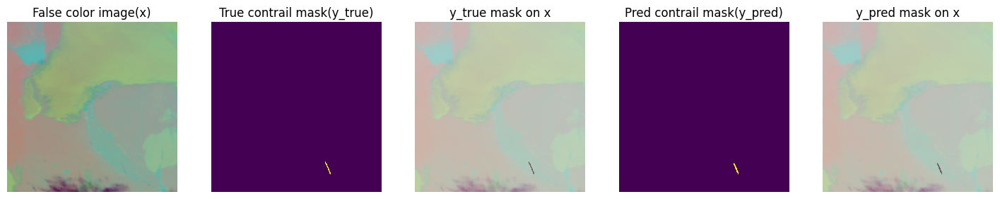

Val Batch:   116/116            | Loss: 0.009341:  90%|█████████ | 27/30 [6:28:06<43:26, 868.77s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.006807         | Val = 0.004866
Dice: Train = 0.710700         | Val = 0.527031

EPOCH: 28/30


Train Batch: 1283/1283        | Loss: 0.006666:  90%|█████████ | 27/30 [6:41:43<43:26, 868.77s/it]  

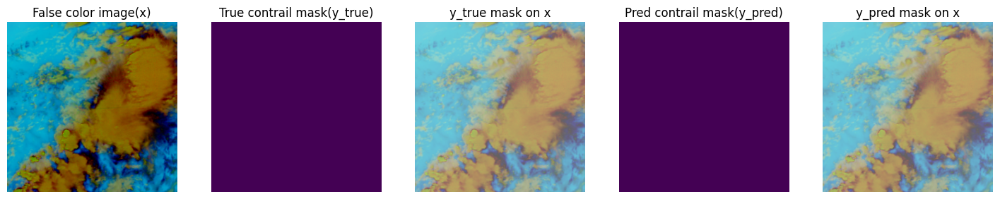

Val Batch:   116/116            | Loss: 0.002547:  90%|█████████ | 27/30 [6:43:10<43:26, 868.77s/it]

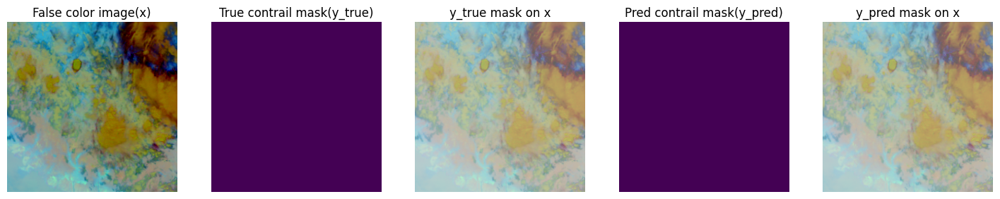

Val Batch:   116/116            | Loss: 0.002547:  93%|█████████▎| 28/30 [6:43:11<29:18, 879.44s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.006944         | Val = 0.005010
Dice: Train = 0.704026         | Val = 0.525652

EPOCH: 29/30


Train Batch: 1283/1283        | Loss: 0.008571:  93%|█████████▎| 28/30 [6:56:56<29:18, 879.44s/it]  

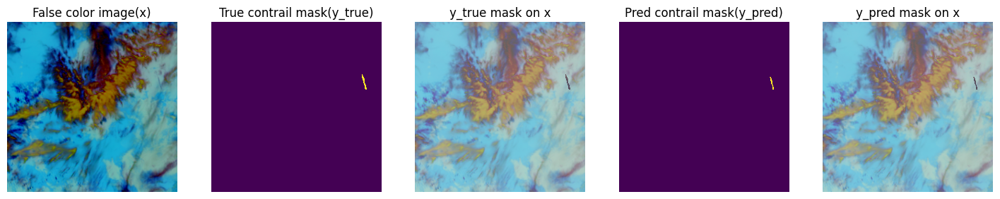

Val Batch:   116/116            | Loss: 0.006964:  93%|█████████▎| 28/30 [6:58:07<29:18, 879.44s/it]

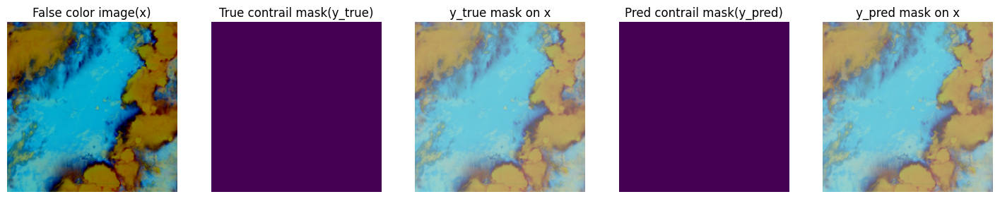

Val Batch:   116/116            | Loss: 0.006964:  97%|█████████▋| 29/30 [6:58:08<14:44, 884.68s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.006513         | Val = 0.005704
Dice: Train = 0.723744         | Val = 0.474975

EPOCH: 30/30


Train Batch: 1283/1283        | Loss: 0.011052:  97%|█████████▋| 29/30 [7:11:29<14:44, 884.68s/it]  

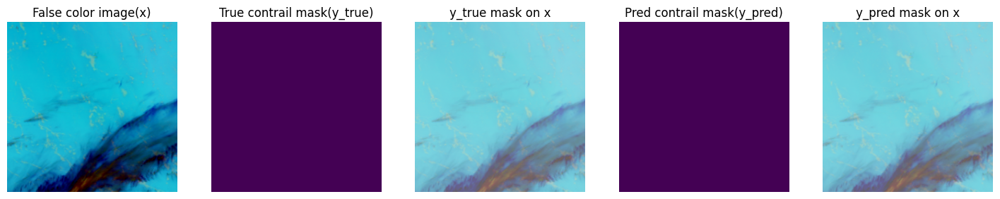

Val Batch:   116/116            | Loss: 0.003563:  97%|█████████▋| 29/30 [7:12:44<14:44, 884.68s/it]

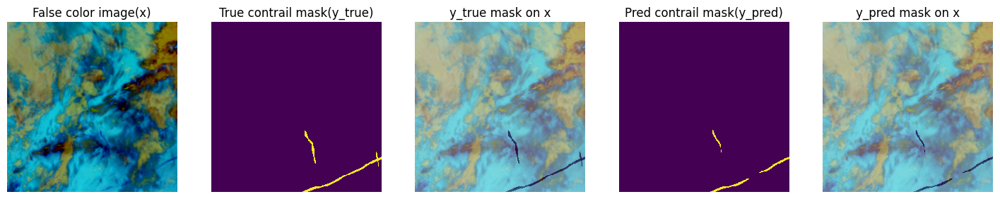

Val Batch:   116/116            | Loss: 0.003563: 100%|██████████| 30/30 [7:12:44<00:00, 865.49s/it]

Train sample(above), Val sample(below)
Loss: Train = 0.006517         | Val = 0.006110
Dice: Train = 0.724462         | Val = 0.476028


In [13]:
 pbar = tqdm(range(EPOCHS))

 for epoch in pbar:
     print(f"\nEPOCH: {epoch+1}/{EPOCHS}")
     model.train()
     for idx, (data, target) in enumerate(train_loader):
         data, target = data.to(DEVICE), target.to(DEVICE) #Copy to GPU if available
         y_pred = model(data)
         loss = loss_fn(y_pred, target)
         optimizer.zero_grad()
         loss.backward()
         optimizer.step()
        
         loss_tracker.on_train_batch_end(loss.item())
         dice_tracker.on_train_batch_end(dice_coeff(y_pred>0.5, target))
         pbar.set_description(f"Train Batch: {idx+1}/{len(train_loader)}\
         | Loss: {loss.item():.6f}")
    
     plot_contrail_comparision(data[0].cpu().detach(),
                               target[0].cpu().detach(),
                               y_pred[0].cpu().detach()>0.5)
     model.eval()    
     with torch.no_grad():
         for idx, (data, target) in enumerate(val_loader):
             data, target = data.to(DEVICE), target.to(DEVICE) #Copy to GPU if available
             y_pred = model(data)
             loss = loss_fn(y_pred, target)
             loss_tracker.on_val_batch_end(loss.item())
             dice_tracker.on_val_batch_end(dice_coeff(y_pred>0.5, target))
             pbar.set_description(f"Val Batch:   {idx+1}/{len(val_loader)}\
             | Loss: {loss.item():.6f}")
         plot_contrail_comparision(data[0].cpu().detach(),
                                   target[0].cpu().detach(),
                                   y_pred[0].cpu().detach()>0.5)
     print("Train sample(above), Val sample(below)")
     scheduler.step(loss.item())
     loss_tracker.on_epoch_end()
     dice_tracker.on_epoch_end()
     save_state.on_epoch_end()

 save_state.on_end()
 loss_tracker.on_end()
 dice_tracker.on_end()

In [ ]:
# Load pretrained states:
model.load_state_dict(torch.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/model_state_2023-05-12_06_31_20.pt",map_location=torch.device(DEVICE)))
optimizer.load_state_dict(torch.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/optim_state_2023-05-12_06_31_20.pt",map_location=torch.device(DEVICE)))
loss_tracker.train_batch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/train_batch.npy")
loss_tracker.train_epoch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/train_epoch.npy")
loss_tracker.val_batch_histroy=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/val_batch.npy")
loss_tracker.val_epoch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Loss/val_epoch.npy")
dice_tracker.train_batch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Dice/train_batch.npy")
dice_tracker.train_epoch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Dice/train_epoch.npy")
dice_tracker.val_batch_histroy=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Dice/val_batch.npy")
dice_tracker.val_epoch_history=np.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/Dice/val_epoch.npy")


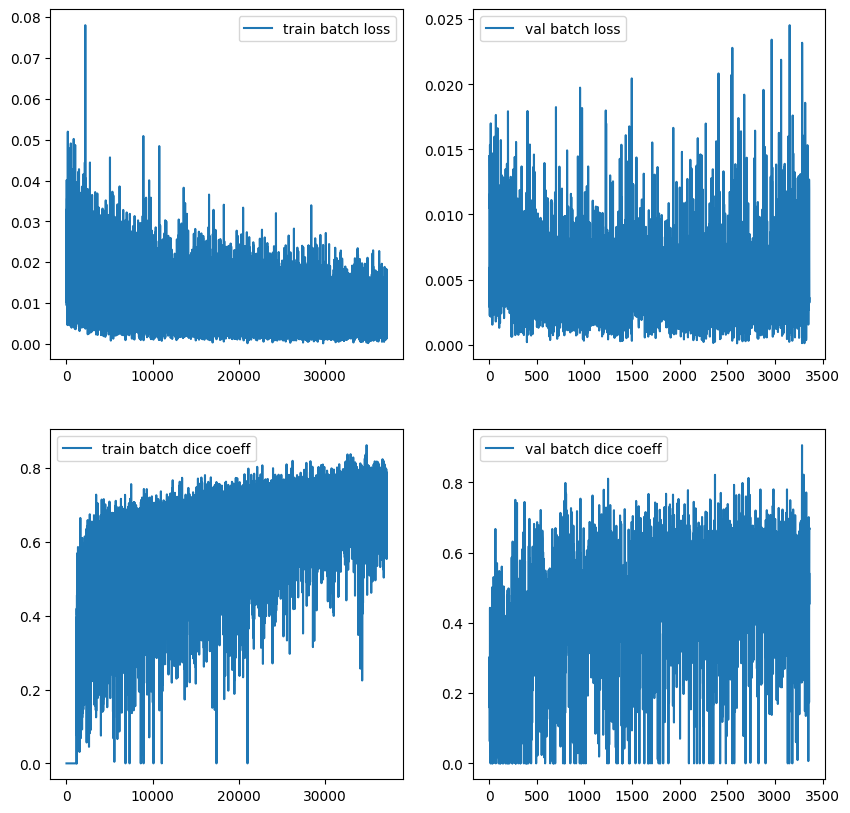

In [14]:
plt.figure(figsize=(10,10))
ax = plt.subplot(2,2,1)
ax.plot(loss_tracker.train_batch_history[len(train_loader):], label="train batch loss")
ax.legend()
ax = plt.subplot(2,2,2)
ax.plot(loss_tracker.val_batch_histroy[len(val_loader):], label="val batch loss")
ax.legend()
ax = plt.subplot(2,2,3)
ax.plot(dice_tracker.train_batch_history[len(train_loader):], label="train batch dice coeff")
ax.legend()
ax = plt.subplot(2,2,4)
ax.plot(dice_tracker.val_batch_histroy[len(val_loader):], label="val batch dice coeff")
ax.legend()
plt.show()

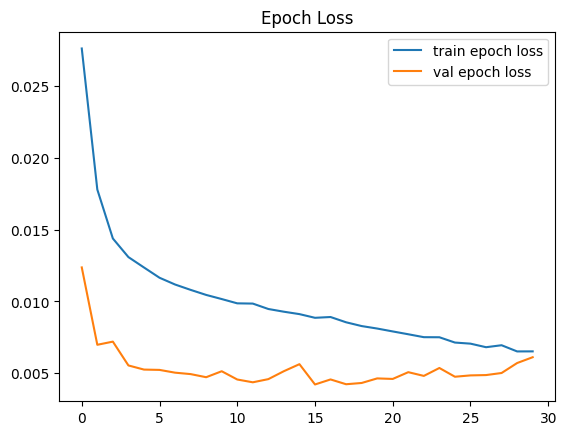

In [15]:
plt.plot(loss_tracker.train_epoch_history, label="train epoch loss")
plt.plot(loss_tracker.val_epoch_history, label="val epoch loss")
plt.legend()
plt.title("Epoch Loss")
plt.show()

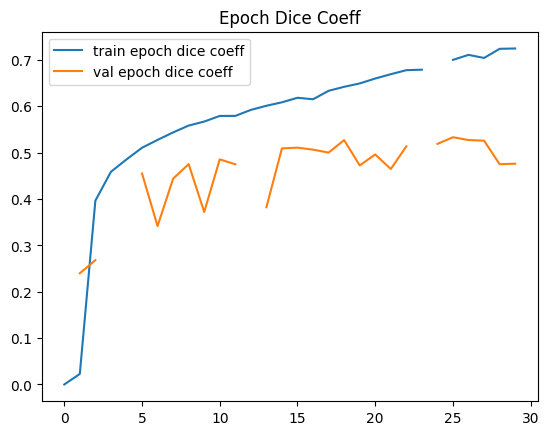

In [16]:
plt.plot(dice_tracker.train_epoch_history, label="train epoch dice coeff")
plt.plot(dice_tracker.val_epoch_history, label="val epoch dice coeff")
plt.legend()
plt.title("Epoch Dice Coeff")
plt.show()

### Model prediction

In [ ]:
model.load_state_dict(torch.load("/kaggle/input/unet-trained-weights-contrails/contrails_save_states/saved_states/model_state_2023-05-12_06_31_20.pt",map_location=torch.device(DEVICE)))

In [ ]:
# Datasets 
'''dataset_params = {
    "bands" : [11,14,15], 
    "transforms" : [ash_transform]
}
train_dataset = ContrailDataset(train_ids, train_path, **dataset_params)
test_dataset = ContrailDataset(test_ids, test_path, test_mode=True, **dataset_params)
val_dataset = ContrailDataset(val_ids, val_path, **dataset_params)

# DalaLoaders
dataloader_params = {
    "batch_size" : 16,
    "shuffle" : True,
    "num_workers": 2,
    "drop_last": True
#     "pin_memory": True

}

test_loader = DataLoader(test_dataset, shuffle=False, batch_size=2)'''

In [27]:
y_pred_all = []

model.eval()    
with torch.no_grad():
    for idx, data in enumerate(test_loader):
        data = data.to(DEVICE) #Copy to GPU if available
        y_pred = model(data)
        y_pred_all.append(y_pred.sigmoid().squeeze().cpu().detach().numpy())


In [28]:
y_pred = np.concatenate(y_pred_all)
print(y_pred.shape)   

(2, 256, 256)


In [29]:
y_pred

array([[[0.5000255 , 0.50003093, 0.5000178 , ..., 0.5000349 ,
         0.5000797 , 0.5000467 ],
        [0.5000719 , 0.50001985, 0.5000063 , ..., 0.5000077 ,
         0.5000542 , 0.50008494],
        [0.50001377, 0.50001   , 0.5000106 , ..., 0.5000235 ,
         0.50014836, 0.5002208 ],
        ...,
        [0.5000178 , 0.5000016 , 0.50000197, ..., 0.50000066,
         0.5000057 , 0.50000936],
        [0.5002277 , 0.5000297 , 0.50001514, ..., 0.5000027 ,
         0.50005245, 0.5000709 ],
        [0.500241  , 0.50019044, 0.5000793 , ..., 0.5000104 ,
         0.5000914 , 0.500044  ]],

       [[0.5000693 , 0.50031114, 0.500196  , ..., 0.50001204,
         0.5000372 , 0.5000256 ],
        [0.5002015 , 0.5002597 , 0.50006515, ..., 0.5000026 ,
         0.50000614, 0.5000122 ],
        [0.50003326, 0.50005734, 0.50001913, ..., 0.500005  ,
         0.5000082 , 0.5000131 ],
        ...,
        [0.50000155, 0.50000006, 0.5000001 , ..., 0.50003445,
         0.50005317, 0.5000479 ],
        [0.5

In [30]:
# しきい値を設定します。
threshold = 0.51

# しきい値より大きい要素は1に、それ以外の要素は0に変換します。
y_pred_th = np.where(y_pred > threshold, 1, 0)


In [26]:
y_pred_th

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]])

### Submission

`rle_encode` and `rle_decode` -> [Reference](https://www.kaggle.com/code/inversion/contrails-rle-submission)

In [19]:
def rle_encode(y_pred, fg_val=1):
    """
    Args:
        x:  numpy array of shape (height, width), 1 - mask, 0 - background
    Returns: run length encoding as list
    """
    dots = np.where(
        y_pred.T.flatten() == fg_val)[0]  # .T sets Fortran order down-then-right
    run_lengths = []
    prev = -2
    for b in dots:
        if b > prev + 1:
            run_lengths.extend((b + 1, 0))
        run_lengths[-1] += 1
        prev = b
    
    def list_to_string(x):
        if x: # non-empty list
            s = str(x).replace("[", "").replace("]", "").replace(",", "")
        else:
            s = '-'
        return s
    
    return list_to_string(run_lengths)

def rle_decode(mask_rle, shape=(256, 256)):
    '''
    mask_rle: run-length as string formatted (start length)
              empty predictions need to be encoded with '-'
    shape: (height, width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''

    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    if mask_rle != '-': 
        s = mask_rle.split()
        starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
        starts -= 1
        ends = starts + lengths
        for lo, hi in zip(starts, ends):
            img[lo:hi] = 1
    return img.reshape(shape, order='F')  # Needed to align to RLE direction

In [20]:
def submit_to_csv(test_ids, y_pred):
    submission_df = pd.read_csv(os.path.join(base_dir, "sample_submission.csv"), 
                                index_col='record_id')
    y_encoded = [rle_encode(y) for y in y_pred]
    submission_df["encoded_pixels"] = y_encoded
    submission_df.index = test_ids
    print(submission_df)
    submission_df.to_csv("submission.csv")
    print("Submitted")

In [ ]:
# # Example submission
# y_pred = torch.randint(0,2,(2, 256, 256))
# submit_to_csv(test_ids, y_pred)

In [21]:
submit_to_csv(test_ids, y_pred)

                    encoded_pixels
1002653297254493116              -
1000834164244036115              -
Submitted
